# Real-world Data Wrangling

In [1]:
# !python -m pip install kaggle==1.6.14

In [2]:
# !pip install --target=/workspace ucimlrepo

In [3]:
#imports
import pandas as pd
import numpy as np
import zipfile
import os
import json
import matplotlib.pyplot as plt

## 1. Gather data



### **1.1.** Problem Statement




⁤The Movies Database dataset contains two datasets: one has titles and related details of nearly 5,000 different movies, and another lists the credits for each movie for the same set. ⁤⁤The goal of this project is to **identify trends in movie production over the years** and **Identify the film team members who have received 100 rating and above**. ⁤⁤We will use data-wrangling techniques to leverage the data to answer these questions in detail. The reason for the selection of this particular dataset is that it contains many unique variables to analyze the movie industry.

### **1.2.** Gather at least two datasets using two different data gathering methods


#### **tmdb_5000_credits**

Type: CSV File


Method: Data was gathered using the "Download data manually" method from Kaggle.

Dataset variables:

*   **movie_id**: Unique identfier for movie.
*   **title**: Movie name.
*   **cast**: Individual cast member's details.
*   **crew**: Crew member associated with a particular film.

In [4]:
#Download data manually
Credits= pd.read_csv("tmdb_5000_credits.csv")


#### tmdb_5000_movies

Type: CSV File

Method: Programmatically downloading files from Kaggle.

Dataset variables:

*   **budget**: Budget of the movie.
*   **genres**: Genres that the movie contains.
*   **homepage**: Movie's webpage.
*   **id**: Unique identifier for the movie.
*   **keywords**: Search terms regarding the movie.
*   **original_language**: The movie's original language was officially released.
*   **original_title**: The movie's name was officially published. 
*   **overview**: A reflection of the film's story. 
*   **popularity**: Popularity scale.
*   **production_companies**: Company that had produced the movie.
*   **production_countries**: Country where the movie was produced.
*   **release_date**: Date of release of the movie.
*   **revenue**: Revenue earned from the movie.
*   **runtime**:  length of the movie in minutes.
*   **spoken_languages**: Language spoken in the movie.
*   **status**: Stages in a film's production lifecycle.
*   **tagline**: A memorable phrase used to capture the tone and idea of the film.
*   **title**: The movie's title.
*   **vote_average**: Average number of votes for the film.
*   **vote_counte**: The total number of votes cast for the movie.






 

In [5]:
#Download data from kaggle
!kaggle datasets download -d tmdb/tmdb-movie-metadata --file tmdb_5000_movies.csv --force

# # extract files
with zipfile.ZipFile('tmdb_5000_movies.csv.zip', 'r') as zip_ref:
    
    #  extracts all
    
    zip_ref.extractall()

# Load csv file
movies = pd.read_csv('tmdb_5000_movies.csv')


  0%|          | 0.00/1.58M [00:00<?, ?B/s]
 63%|######3   | 1.00M/1.58M [00:01<00:00, 890kB/s]
100%|##########| 1.58M/1.58M [00:01<00:00, 1.43MB/s]
100%|##########| 1.58M/1.58M [00:01<00:00, 1.28MB/s]


Dataset URL: https://www.kaggle.com/datasets/tmdb/tmdb-movie-metadata
License(s): other



 ### Data storing step  

In [6]:
#store the raw data in local data store
#Already read the credits dataframe so no need to read again

#Making backup dataframe before cleaning
movies.to_csv('local_tmdb_5000_movies.csv', index=False)
Credits.to_csv('local_tmdb_5000_credits.csv', index=False)




## 2. Assess data



### Quality Issue 1:

In [7]:
#  Inspecting the dataframe visually
movies.sample(55)

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
4352,0,"[{""id"": 99, ""name"": ""Documentary""}, {""id"": 104...",http://www.shinealightmovie.com/,7944,"[{""id"": 242, ""name"": ""new york""}, {""id"": 2793,...",en,Shine a Light,Martin Scorsese and the Rolling Stones unite i...,2.162522,"[{""name"": ""Concert Promotion International"", ""...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",2008-02-07,0,122.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,A master director shining his light on the bes...,Shine a Light,7.2,44
4571,0,[],NaN,328307,[],en,Rise of the Entrepreneur: The Search for a Bet...,The world is changing faster than ever. Techno...,0.052942,[],[],2014-11-20,0,0.0,[],Released,NaN,Rise of the Entrepreneur: The Search for a Bet...,8.0,1
2452,16500000,"[{""id"": 18, ""name"": ""Drama""}]",NaN,11093,"[{""id"": 582, ""name"": ""san francisco""}, {""id"": ...",en,House of Sand and Fog,"Behrani, an Iranian immigrant buys a Californi...",12.102725,"[{""name"": ""DreamWorks SKG"", ""id"": 27}, {""name""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2003-12-19,16942795,126.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Some dreams can't be shared.,House of Sand and Fog,7.0,199
57,180000000,"[{""id"": 16, ""name"": ""Animation""}, {""id"": 10751...",http://disney.go.com/disneypictures/wall-e/,10681,"[{""id"": 9799, ""name"": ""romantic comedy""}]",en,WALL·E,WALL·E is the last robot left on an Earth that...,66.390712,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2008-06-22,521311860,98.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,An adventure beyond the ordinar-E.,WALL·E,7.8,6296
948,0,"[{""id"": 35, ""name"": ""Comedy""}]",NaN,10393,"[{""id"": 579, ""name"": ""american football""}, {""i...",en,The Replacements,Maverick old-guard coach Jimmy McGinty is hire...,14.837288,"[{""name"": ""Warner Bros."", ""id"": 6194}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2000-08-07,0,118.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,Throw the ball. Catch the girl. Keep it simple.,The Replacements,6.1,203
2160,9000000,"[{""id"": 27, ""name"": ""Horror""}, {""id"": 53, ""nam...",NaN,10069,"[{""id"": 282, ""name"": ""video game""}, {""id"": 215...",en,Stay Alive,"After the mysterious, brutal death of an old f...",4.345030,"[{""name"": ""Spyglass Entertainment"", ""id"": 158}...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2006-03-24,27105095,100.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,You die in the game - you die for real.,Stay Alive,5.3,155
1833,45000000,"[{""id"": 35, ""name"": ""Comedy""}]",NaN,10327,"[{""id"": 521, ""name"": ""washington d.c.""}, {""id""...",en,"Legally Blonde 2: Red, White & Blonde","After Elle Woods, the eternally perky, fashion...",4.340616,"[{""name"": ""Type A Films"", ""id"": 2308}, {""name""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2003-07-02,124914842,95.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,Bigger. Bolder. Blonder.,"Legally Blonde 2: Red, White & Blonde",5.1,377
796,60000000,"[{""id"": 35, ""name"": ""Comedy""}, {""id"": 37, ""nam...",http://www.netflix.com/title/80039517,347969,"[{""id"": 155573, ""name"": ""wild west""}]",en,The Ridiculous 6,"When his long-lost outlaw father returns, Tomm...",19.694695,"[{""name"": ""Happy Madison Productions"", ""id"": 2...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2015-12-11,0,119.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,NaN,The Ridiculous 6,4.9,388
4533,0,"[{""id"": 10749, ""name"": ""Romance""}, {""id"": 18, ...",http://www.magpictures.com/drinkingbuddies,172533,"[{""id"": 10556, ""name"": ""m

In [8]:
#Inspecting the dataframe programmatically
# Check for NaN, None, or empty strings
missing_or_empty_budget = movies['budget'].apply(lambda x: x == 0)
missing_or_empty_revenue = movies['revenue'].apply(lambda x: x == 0)

#print number of missing budget,revenue values 
missing_or_empty_budget.sum(),missing_or_empty_revenue.sum()

(1037, 1427)

### Completeness issues: We observe that not all movies have "budget" and "revenue" information for confirmation, we apply the lambda function to the total number of missing values.

### Quality Issue 2:

In [9]:
#Inspecting the dataframe visually
#sample columns 
movies.sample(55)


,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
3452,0,"[{""id"": 35, ""name"": ""Comedy""}, {""id"": 18, ""nam...",NaN,20322,"[{""id"": 10183, ""name"": ""independent film""}, {""...",en,The Brothers,"This is the story of four African-American ""yu...",3.029944,[],"[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2001-03-23,0,106.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,NaN,The Brothers,6.5,10
2689,14000000,"[{""id"": 35, ""name"": ""Comedy""}]",http://www.foxsearchlight.com/ourfamilywedding/,34563,"[{""id"": 10188, ""name"": ""interracial marriage""}...",en,Our Family Wedding,The weeks leading up to a young couple's weddi...,6.733485,"[{""name"": ""Fox Searchlight Pictures"", ""id"": 43...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2010-03-12,21409028,103.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,To have and to hold... 'Til dads do us part.,Our Family Wedding,5.7,39
2517,15000000,"[{""id"": 18, ""name"": ""Drama""}, {""id"": 36, ""name...",http://www.kingsspeech.com/,45269,"[{""id"": 1025, ""name"": ""great britain""}, {""id"":...",en,The King's Speech,The King's Speech tells the story of the man w...,54.053576,"[{""name"": ""The Weinstein Company"", ""id"": 308},...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""}]",2010-09-06,414211549,118.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,Find your voice.,The King's Speech,7.6,2752
2563,14000000,"[{""id"": 35, ""name"": ""Comedy""}, {""id"": 18, ""nam...",NaN,17880,[],en,Because of Winn-Dixie,"A girl, abandoned by her mother when she was t...",3.334804,"[{""name"": ""Twentieth Century Fox Film Corporat...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2005-02-18,32645546,106.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,Discover what happens when you go looking for ...,Because of Winn-Dixie,6.1,61
4587,500000,"[{""id"": 27, ""name"": ""Horror""}, {""id"": 878, ""na...",NaN,18045,"[{""id"": 1329, ""name"": ""canada""}, {""id"": 1442, ...",en,The Dark Hours,"Dr. Samantha Goodman is a beautiful, young psy...",1.428483,"[{""name"": ""Calder Road Film"", ""id"": 3435}, {""n...","[{""iso_3166_1"": ""CA"", ""name"": ""Canada""}]",2005-03-11,0,80.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,NaN,The Dark Hours,5.5,22
1485,33000000,"[{""id"": 9648, ""name"": ""Mystery""}, {""id"": 53, ""...",NaN,10685,"[{""id"": 520, ""name"": ""chicago""}, {""id"": 1812, ...",en,The Watcher,"FBI agent Joel Campbell, burnt-out and shell-s...",7.339908,"[{""name"": ""Universal Pictures"", ""id"": 33}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2000-09-08,0,96.0,"[{""iso_639_1"": ""vi"", ""name"": ""Ti\u1ebfng Vi\u1...",Released,Don't go home alone.,The Watcher,4.9,110
3932,0,"[{""id"": 18, ""name"": ""Drama""}]",NaN,17734,"[{""id"": 10183, ""name"": ""independent film""}, {""...",en,Thirteen Conversations About One Thing,"The lives of a lawyer, an actuary, a houseclea...",6.997495,[],"[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2001-09-02,0,104.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,Ask yourself if you're really happy.,Thirteen Conversations About One Thing,6.4,25
4148,0,"[{""id"": 35, ""name"": ""Comedy""}]",http://coffeetown.com/,198062,"[{""id"": 5483, ""name"": ""coffee shop""}, {""id"": 8...",en,Coffee Town,Three thirty-something friends band together w...,2.253589,[],"[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2013-07-09,0,87.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,NaN,Coffee Town,6.7,45
1515,28000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 35, ""nam...",NaN,11141,"[{""id"": 1208, ""name"": ""irland""}, {""id"": 2570, ...",en,Laws of Attraction,"Amidst a sea of litigation, two New York 

In [10]:
#Inspecting the dataframe programmatically
#get information about the datatype of each column
movies.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4803 entries, 0 to 4802
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                4803 non-null   int64  
 1   genres                4803 non-null   object 
 2   homepage              1712 non-null   object 
 3   id                    4803 non-null   int64  
 4   keywords              4803 non-null   object 
 5   original_language     4803 non-null   object 
 6   original_title        4803 non-null   object 
 7   overview              4800 non-null   object 
 8   popularity            4803 non-null   float64
 9   production_companies  4803 non-null   object 
 10  production_countries  4803 non-null   object 
 11  release_date          4802 non-null   object 
 12  revenue               4803 non-null   int64  
 13  runtime               4801 non-null   float64
 14  spoken_languages      4803 non-null   object 
 15  status               

### Validity issue:"release_date" is not in the correct data type "Date", we used the .info to get the datatype for each column.

### Tidiness Issue 1:

In [11]:
#Inspecting the dataframe visually
Credits["crew"]

0       [{"credit_id": "52fe48009251416c750aca23", "de...
1       [{"credit_id": "52fe4232c3a36847f800b579", "de...
2       [{"credit_id": "54805967c3a36829b5002c41", "de...
3       [{"credit_id": "52fe4781c3a36847f81398c3", "de...
4       [{"credit_id": "52fe479ac3a36847f813eaa3", "de...
                              ...                        
4798    [{"credit_id": "52fe44eec3a36847f80b280b", "de...
4799    [{"credit_id": "52fe487dc3a368484e0fb013", "de...
4800    [{"credit_id": "52fe4df3c3a36847f8275ecf", "de...
4801    [{"credit_id": "52fe4ad9c3a368484e16a36b", "de...
4802    [{"credit_id": "58ce021b9251415a390165d9", "de...
Name: crew, Length: 4803, dtype: object

In [12]:
#Inspecting the dataframe programmatically
Credits['crew'] = Credits['crew'].apply(json.loads)

# Inspect the first few rows again to see the changes

# # Inspect the JSON data in the 'crew' column
for index, row in Credits.iterrows():
    print(f"\nRow {index + 1} crew data:")
    for member in row['crew']:
        for key, value in member.items():
            print(f"  {key}: {value}")
            
# print("\nFirst row crew data:", first_row_crew)

first_member_name = Credits.loc[0, 'crew'][0]['name']
print("First member's name in the first row crew:", first_member_name)


Row 1 crew data:
  credit_id: 52fe48009251416c750aca23
  department: Editing
  gender: 0
  id: 1721
  job: Editor
  name: Stephen E. Rivkin
  credit_id: 539c47ecc3a36810e3001f87
  department: Art
  gender: 2
  id: 496
  job: Production Design
  name: Rick Carter
  credit_id: 54491c89c3a3680fb4001cf7
  department: Sound
  gender: 0
  id: 900
  job: Sound Designer
  name: Christopher Boyes
  credit_id: 54491cb70e0a267480001bd0
  department: Sound
  gender: 0
  id: 900
  job: Supervising Sound Editor
  name: Christopher Boyes
  credit_id: 539c4a4cc3a36810c9002101
  department: Production
  gender: 1
  id: 1262
  job: Casting
  name: Mali Finn
  credit_id: 5544ee3b925141499f0008fc
  department: Sound
  gender: 2
  id: 1729
  job: Original Music Composer
  name: James Horner
  credit_id: 52fe48009251416c750ac9c3
  department: Directing
  gender: 2
  id: 2710
  job: Director
  name: James Cameron
  credit_id: 52fe48009251416c750ac9d9
  department: Writing
  gender: 2
  id: 2710
  job: Write

  job: CG Supervisor
  name: Artemis Oikonomopoulou
  credit_id: 54e5bfda92514109f9001f95
  department: Crew
  gender: 0
  id: 1428898
  job: CG Supervisor
  name: Karl Herbst
  credit_id: 54e5c0479251410a01001e21
  department: Visual Effects
  gender: 0
  id: 1428901
  job: Animation Supervisor
  name: Eamonn Butler
  credit_id: 54e5c0a292514109f9001fd7
  department: Crew
  gender: 0
  id: 1428902
  job: Visual Effects Editor
  name: Conor Byrne
  credit_id: 54e5c0c1c3a36816cb00193b
  department: Crew
  gender: 0
  id: 1428903
  job: Visual Effects Editor
  name: Allen Cappuccilli
  credit_id: 54e5c119c3a36816cb001956
  department: Crew
  gender: 0
  id: 1428904
  job: Visual Effects Editor
  name: Liana Jackson
  credit_id: 54e5c1359251410a03001c67
  department: Crew
  gender: 0
  id: 1428905
  job: Visual Effects Editor
  name: Laura Jennings
  credit_id: 54e5c15b9251410a03001c73
  department: Crew
  gender: 0
  id: 1428906
  job: Visual Effects Editor
  name: Christopher Learmonth


  credit_id: 57e69f8c925141390b0081ec
  department: Writing
  gender: 0
  id: 1262615
  job: Characters
  name: Johnny Romita
  credit_id: 57e66c51c3a36822270069ca
  department: Costume & Make-Up
  gender: 0
  id: 1320911
  job: Makeup Artist
  name: Linda Grimes
  credit_id: 570fcb829251416d95000728
  department: Visual Effects
  gender: 0
  id: 1340132
  job: Visual Effects Producer
  name: Blondel Aidoo
  credit_id: 57e69d7cc3a36835a2007ef5
  department: Visual Effects
  gender: 0
  id: 1346330
  job: Digital Compositors
  name: Lloyd Lee Barnett
  credit_id: 57e69cf5c3a368226900856b
  department: Sound
  gender: 0
  id: 1378225
  job: Sound Designer
  name: Susan Dudeck
  credit_id: 57e69754c3a368351e00754c
  department: Crew
  gender: 0
  id: 1378248
  job: Transportation Captain
  name: Randy Peters
  credit_id: 57e69c3c925141395e007ebd
  department: Sound
  gender: 0
  id: 1389858
  job: First Assistant Sound Editor
  name: Jamie Hardt
  credit_id: 57e66a0392514141460096b9
  dep

  name: Paul Massey
  credit_id: 563f4b389251413442006a65
  department: Sound
  gender: 0
  id: 113073
  job: Sound Re-Recording Mixer
  name: Paul Massey
  credit_id: 563f4b1992514129fe02019b
  department: Sound
  gender: 0
  id: 113097
  job: Sound Effects Editor
  name: Derek Vanderhorst
  credit_id: 563f4706c3a3681b5e02c7f8
  department: Costume & Make-Up
  gender: 1
  id: 66692
  job: Hair Department Head
  name: Kathrine Gordon
  credit_id: 54f381f792514179a4000202
  department: Production
  gender: 1
  id: 59445
  job: Casting
  name: Donna DeSeta
  credit_id: 5819fca492514133a80070c5
  department: Production
  gender: 2
  id: 79664
  job: Production Manager
  name: Jim Behnke
  credit_id: 563f3c0b9251411867006f82
  department: Lighting
  gender: 2
  id: 79790
  job: Gaffer
  name: Rafael E. Sánchez
  credit_id: 581a0cb7c3a36853a50005ba
  department: Crew
  gender: 2
  id: 103057
  job: Thanks
  name: Giorgio Armani
  credit_id: 563f4aa2c3a36862da0078d6
  department: Sound
  gen

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  name: Matt Magnolia
  credit_id: 56d6277c92514112cd000ad7
  department: Writing
  gender: 0
  id: 1585197
  job: Storyboard
  name: Darrin Denlinger
  credit_id: 58fde21a925141640b02f82f
  department: Art
  gender: 0
  id: 1717520
  job: Assistant Property Master
  name: Craig Baron
  credit_id: 5901d5a092514155ce00b07f
  department: Sound
  gender: 0
  id: 1762004
  job: Musician
  name: Kevin Connolly
  credit_id: 58fde3d3925141642f03006b
  department: Camera
  gender: 0
  id: 1802585
  job: Grip
  name: Joe Chouchanian
  credit_id: 58fde435c3a36879be030c72
  department: Crew
  gender: 0
  id: 1802587
  job: Animal Coordinator
  name: Steve Berens
  credit_id: 5901d4a2c3a368111200ae93
  department: Directing
  gender: 0
  id: 1804880
  job: Second Assistant Director
  name: Conte Mark Matal

Row 2025 crew data:
  credit_id: 574dc2c3925141120e0000cb
  department: Production
  gender: 1
  id: 1302
  job: Casting
  name: Susie Figgis
  credit_id: 52fe4276c3a36847f8020687
  department

  gender: 0
  id: 1338670
  job: Hair Department Head
  name: Joy Zapata
  credit_id: 5693ca159251415c2300001f
  department: Sound
  gender: 2
  id: 1339447
  job: Boom Operator
  name: Tom Hartig
  credit_id: 53e2c815c3a368486000119a
  department: Art
  gender: 0
  id: 1350459
  job: Art Direction
  name: Gary Warshaw
  credit_id: 5693c93bc3a3684cff004f44
  department: Directing
  gender: 1
  id: 1377240
  job: Script Supervisor
  name: Brenda Lopez
  credit_id: 5693ca46c3a3687b5e000024
  department: Production
  gender: 0
  id: 1400007
  job: Production Supervisor
  name: Michelle Brattson
  credit_id: 5693c9989251415c2a00000c
  department: Sound
  gender: 2
  id: 1412228
  job: Sound mixer
  name: Steve Nelson
  credit_id: 5693c9f9c3a3687b5e000019
  department: Sound
  gender: 0
  id: 1546047
  job: Music Supervisor
  name: Manish Raval
  credit_id: 5693ca00c3a3687b46000016
  department: Sound
  gender: 0
  id: 1546047
  job: Music Editor
  name: Manish Raval
  credit_id: 5693c9b892


Row 2533 crew data:
  credit_id: 52fe450dc3a36847f80b9a53
  department: Sound
  gender: 2
  id: 153
  job: Original Music Composer
  name: Thomas Newman
  credit_id: 52fe450dc3a36847f80b9a69
  department: Costume & Make-Up
  gender: 0
  id: 557
  job: Costume Design
  name: Colleen Atwood
  credit_id: 52fe450dc3a36847f80b9a4d
  department: Production
  gender: 1
  id: 1899
  job: Producer
  name: Denise Di Novi
  credit_id: 569b97989251410cd0002faf
  department: Sound
  gender: 0
  id: 3904
  job: Sound Designer
  name: Lee Smith
  credit_id: 569b951e9251410cca002dbd
  department: Production
  gender: 1
  id: 6119
  job: Casting
  name: Carrie Frazier
  credit_id: 569b97dfc3a36872b3002ded
  department: Sound
  gender: 2
  id: 7538
  job: Music Editor
  name: Bill Bernstein
  credit_id: 569b94f4c3a36872cb003018
  department: Art
  gender: 0
  id: 8680
  job: Set Decoration
  name: Jim Erickson
  credit_id: 569b94ffc3a36872b3002d55
  department: Art
  gender: 0
  id: 18885
  job: Art Di

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



### Completeness issue: It is challenging to identify the crew members for each movie individually. We plan to create a list for each film that includes all of its crew members.

### Tidiness Issue 2: 

In [13]:
#Inspecting the dataframe visually
Credits["crew"]

0       [{'credit_id': '52fe48009251416c750aca23', 'de...
1       [{'credit_id': '52fe4232c3a36847f800b579', 'de...
2       [{'credit_id': '54805967c3a36829b5002c41', 'de...
3       [{'credit_id': '52fe4781c3a36847f81398c3', 'de...
4       [{'credit_id': '52fe479ac3a36847f813eaa3', 'de...
                              ...                        
4798    [{'credit_id': '52fe44eec3a36847f80b280b', 'de...
4799    [{'credit_id': '52fe487dc3a368484e0fb013', 'de...
4800    [{'credit_id': '52fe4df3c3a36847f8275ecf', 'de...
4801    [{'credit_id': '52fe4ad9c3a368484e16a36b', 'de...
4802    [{'credit_id': '58ce021b9251415a390165d9', 'de...
Name: crew, Length: 4803, dtype: object

In [14]:
#Inspecting the dataframe programmatically

Credits['cast'] = Credits['cast'].apply(json.loads)


# # Inspect the JSON data in the 'crew' column
for index, row in Credits.iterrows():
    print(f"\nRow {index + 1} crew data:")
    for member in row['cast']:
        for key, value in member.items():
            print(f"  {key}: {value}")
first_member_name = Credits.loc[0, 'cast'][0]['character']
print("First member's name in the first row crew:", first_member_name)            


Row 1 crew data:
  cast_id: 242
  character: Jake Sully
  credit_id: 5602a8a7c3a3685532001c9a
  gender: 2
  id: 65731
  name: Sam Worthington
  order: 0
  cast_id: 3
  character: Neytiri
  credit_id: 52fe48009251416c750ac9cb
  gender: 1
  id: 8691
  name: Zoe Saldana
  order: 1
  cast_id: 25
  character: Dr. Grace Augustine
  credit_id: 52fe48009251416c750aca39
  gender: 1
  id: 10205
  name: Sigourney Weaver
  order: 2
  cast_id: 4
  character: Col. Quaritch
  credit_id: 52fe48009251416c750ac9cf
  gender: 2
  id: 32747
  name: Stephen Lang
  order: 3
  cast_id: 5
  character: Trudy Chacon
  credit_id: 52fe48009251416c750ac9d3
  gender: 1
  id: 17647
  name: Michelle Rodriguez
  order: 4
  cast_id: 8
  character: Selfridge
  credit_id: 52fe48009251416c750ac9e1
  gender: 2
  id: 1771
  name: Giovanni Ribisi
  order: 5
  cast_id: 7
  character: Norm Spellman
  credit_id: 52fe48009251416c750ac9dd
  gender: 2
  id: 59231
  name: Joel David Moore
  order: 6
  cast_id: 9
  character: Moat
 

  order: 19
  cast_id: 59
  character: Bereet
  credit_id: 545ed5770e0a262359000705
  gender: 0
  id: 1133011
  name: Melia Kreiling
  order: 20
  cast_id: 123
  character: The Broker
  credit_id: 549fe6dfc3a3685542007334
  gender: 2
  id: 8399
  name: Christopher Fairbank
  order: 21
  cast_id: 58
  character: Nova Prime's Assistant
  credit_id: 545ed5590e0a261fa6007d84
  gender: 1
  id: 1363394
  name: Mikaela Hoover
  order: 22
  cast_id: 150
  character: Pit Boss
  credit_id: 54a07a7fc3a368554200834a
  gender: 0
  id: 1312266
  name: Marama Corlett
  order: 23
  cast_id: 137
  character: Head Riot Guard
  credit_id: 54a0314cc3a3682f1e00ab42
  gender: 0
  id: 1111204
  name: Emmett Scanlan
  order: 24
  cast_id: 141
  character: Moloka Dar
  credit_id: 54a0380a9251412127001cb8
  gender: 0
  id: 1211540
  name: Alexis Rodney
  order: 25
  cast_id: 130
  character: Horuz
  credit_id: 54a00ef39251411d53004edf
  gender: 2
  id: 95051
  name: Tom Proctor
  order: 26
  cast_id: 139
  char

  order: 13
  cast_id: 23
  character: Guards & Gypsies (voice)
  credit_id: 52fe43859251416c7501396d
  gender: 2
  id: 61968
  name: Patrick Pinney
  order: 14
  cast_id: 24
  character: The Old Heretic (voice)
  credit_id: 52fe43859251416c75013971
  gender: 2
  id: 62047
  name: Gary Trousdale
  order: 15
  cast_id: 64
  character: Baby Bird (voice)
  credit_id: 57506e7f9251413080000053
  gender: 2
  id: 15831
  name: Frank Welker
  order: 16

Row 290 crew data:
  cast_id: 11
  character: Kuzco (voice)
  credit_id: 52fe44799251416c750360c7
  gender: 2
  id: 60950
  name: David Spade
  order: 0
  cast_id: 13
  character: Patcha (voice)
  credit_id: 52fe44799251416c750360cf
  gender: 2
  id: 1230
  name: John Goodman
  order: 2
  cast_id: 15
  character: Yzma (voice)
  credit_id: 52fe44799251416c750360d7
  gender: 1
  id: 70243
  name: Eartha Kitt
  order: 4
  cast_id: 17
  character: Kronk (voice)
  credit_id: 52fe44799251416c750360df
  gender: 2
  id: 9657
  name: Patrick Warburton
 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  name: Adam Devine
  order: 26
  cast_id: 75
  character: Beer Pong Guy #2
  credit_id: 56ca168092514123b8001cbc
  gender: 0
  id: 521564
  name: Blake Anderson
  order: 27
  cast_id: 76
  character: Beer Pong Guy #3
  credit_id: 56ca1695c3a3684095008df6
  gender: 2
  id: 521563
  name: Anders Holm
  order: 28
  cast_id: 83
  character: Wendy the Realtor
  credit_id: 57d2e8ecc3a36842910013bd
  gender: 1
  id: 448309
  name: Liz Cackowski
  order: 29
  cast_id: 77
  character: Beer Pong Guy #4
  credit_id: 56ca16ad925141172f008677
  gender: 0
  id: 1254001
  name: Kyle Newacheck
  order: 30
  cast_id: 79
  character: The Babysitter
  credit_id: 56ca18f692514123b8001d81
  gender: 2
  id: 168872
  name: Jesse Heiman
  order: 31
  cast_id: 18
  character: Sorority Girl
  credit_id: 52fe4d169251416c9110a255
  gender: 0
  id: 1203537
  name: Cassandra Starr
  order: 32
  cast_id: 41
  character: Prostitute
  credit_id: 542719230e0a2655660005f7
  gender: 1
  id: 1214835
  name: Natasha Legge

  credit_id: 52fe45969251416c7505ba8d
  gender: 1
  id: 5606
  name: Sissy Spacek
  order: 2
  cast_id: 4
  character: Jesse Tuck
  credit_id: 52fe45969251416c7505ba91
  gender: 2
  id: 23495
  name: Jonathan Jackson
  order: 3
  cast_id: 5
  character: Miles Tuck
  credit_id: 52fe45969251416c7505ba95
  gender: 2
  id: 82519
  name: Scott Bairstow
  order: 4
  cast_id: 6
  character: Man in the Yellow Suit
  credit_id: 52fe45969251416c7505ba99
  gender: 2
  id: 2282
  name: Ben Kingsley
  order: 5
  cast_id: 7
  character: Mother Foster
  credit_id: 52fe45969251416c7505ba9d
  gender: 1
  id: 27563
  name: Amy Irving
  order: 6
  cast_id: 8
  character: Robert Foster
  credit_id: 52fe45969251416c7505baa1
  gender: 2
  id: 8536
  name: Victor Garber
  order: 7

Row 2579 crew data:
  cast_id: 1
  character: John Triton
  credit_id: 52fe44cdc3a36847f80aadd5
  gender: 2
  id: 56446
  name: John Cena
  order: 0
  cast_id: 2
  character: Kate Triton
  credit_id: 52fe44cdc3a36847f80aadd9
  gen

  gender: 2
  id: 15439
  name: Gary Farmer
  order: 9
  cast_id: 15
  character: Wally Enfield
  credit_id: 52fe44d7c3a36847f80ad283
  gender: 2
  id: 12826
  name: Charles Fleischer
  order: 10
  cast_id: 16
  character: Homer
  credit_id: 52fe44d7c3a36847f80ad287
  gender: 2
  id: 956719
  name: Tim DeZarn
  order: 11
  cast_id: 17
  character: Wanda
  credit_id: 52fe44d7c3a36847f80ad28b
  gender: 1
  id: 43068
  name: Sherrie Rose
  order: 12
  cast_id: 18
  character: Danny
  credit_id: 52fe44d7c3a36847f80ad28f
  gender: 2
  id: 166406
  name: Ryan O'Donohue
  order: 13
  cast_id: 19
  character: Sirach
  credit_id: 52fe44d7c3a36847f80ad293
  gender: 0
  id: 1108092
  name: Tony Salome
  order: 14
  cast_id: 20
  character: Party babe
  credit_id: 52fe44d7c3a36847f80ad297
  gender: 1
  id: 544069
  name: Chasey Lain
  order: 15
  cast_id: 21
  character: Party babe
  credit_id: 52fe44d7c3a36847f80ad29b
  gender: 1
  id: 97780
  name: Traci Bingham
  order: 16
  cast_id: 22
  chara

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



### Consistency issue:Finding the number of departments for each movie in the dataset is difficult. hence, we plan to create a clearer list that contains the number of different departments in each film.

## 3. Clean data
Clean the data to solve the 4 issues corresponding to data quality and tidiness found in the assessing step. **Make sure you include justifications for your cleaning decisions.**

After the cleaning for each issue, please use **either** the visually or programatical method to validate the cleaning was succesful.

At this stage, you are also expected to remove variables that are unnecessary for your analysis and combine your datasets. Depending on your datasets, you may choose to perform variable combination and elimination before or after the cleaning stage. Your dataset must have **at least** 4 variables after combining the data.

In [15]:
# Make copies of the datasets to ensure the raw dataframes are not impacted


##Already done it above

# I would not create another copy since we've already converted the "cast" and "crew" columns to JSON format.## movies.to_csv('local_tmdb_5000_movies.csv', index=False)

## movies.to_csv('local_tmdb_5000_movies.csv', index=False)
## Credits.to_csv('local_tmdb_5000_credits.csv', index=False)

### Quality Issue 1:Missing values in "budget" and "revenue" columns.

In [16]:
#Apply the cleaning strategy



movies['revenue'] = movies['revenue'].replace(["nan", "None"], np.nan)
movies['budget'] = movies['budget'].replace(["nan", "None"], np.nan)

# Step 2: Replace zeros with NaN
movies['budget'].replace(0, np.nan,inplace=True)
movies['revenue'].replace(0, np.nan,inplace=True)

# Step 3: Convert to float, removing commas
movies['revenue'] = movies['revenue'].apply(lambda x: float(str(x).replace(',', '')) if pd.notnull(x) else np.nan)
movies['budget'] = movies['budget'].apply(lambda x: float(str(x).replace(',', '')) if pd.notnull(x) else np.nan)


In [17]:
#Validate the cleaning was successful
movies.sample(5)

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
1205,43000000.0,"[{""id"": 18, ""name"": ""Drama""}, {""id"": 27, ""name...",NaN,9913,"[{""id"": 428, ""name"": ""nurse""}, {""id"": 1328, ""n...",en,The Skeleton Key,A hospice nurse working at a spooky New Orlean...,29.105407,"[{""name"": ""Universal Pictures"", ""id"": 33}, {""n...","[{""iso_3166_1"": ""DE"", ""name"": ""Germany""}, {""is...",2005-07-29,91974818.0,104.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,Fearing Is Believing,The Skeleton Key,6.4,573
1014,48000000.0,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 35, ""...",NaN,9896,"[{""id"": 585, ""name"": ""casino""}, {""id"": 795, ""n...",en,Rat Race,"In an ensemble film about easy money, greed, m...",18.600490,"[{""name"": ""Paramount Pictures"", ""id"": 4}, {""na...","[{""iso_3166_1"": ""CA"", ""name"": ""Canada""}, {""iso...",2001-07-30,85498534.0,112.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,563 miles. 9 people. $2 million. 1001 problems!,Rat Race,6.0,518
788,58000000.0,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.foxmovies.com/movies/deadpool,293660,"[{""id"": 2095, ""name"": ""anti hero""}, {""id"": 307...",en,Deadpool,Deadpool tells the origin story of former Spec...,514.569956,"[{""name"": ""Twentieth Century Fox Film Corporat...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2016-02-09,783112979.0,108.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,Witness the beginning of a happy ending,Deadpool,7.4,10995
266,120000000.0,"[{""id"": 28, ""name"": ""Action""}, {""id"": 878, ""na...",NaN,2048,"[{""id"": 236, ""name"": ""suicide""}, {""id"": 310, ""...",en,"I, Robot","In 2035, where robots are common-place and abi...",95.914473,"[{""name"": ""Twentieth Century Fox Film Corporat...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2004-07-15,347234916.0,115.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,Laws are made to be broken.,"I, Robot",6.7,3793
1850,25000000.0,"[{""id"": 28, ""name"": ""Action""}, {""id"": 80, ""nam...",NaN,111,"[{""id"": 416, ""name"": ""miami""}, {""id"": 417, ""na...",en,Scarface,After getting a green card in exchange for ass...,70.105981,"[{""name"": ""Universal Pictures"", ""id"": 33}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",1983-12-08,65884703.0,170.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,The world is yours...,Scarface,8.0,2948


In [18]:
# Calculate mean for budget and mode for revenue
budget_mean = int(movies['budget'].mean())
revenue_mean = movies['revenue'].mean()

#print the values for mean and mode 
print("Budget meane value is equal to",budget_mean)
print("mean value for revenue column is equal to",revenue_mean)

# Replace NaN values
movies['budget'].fillna(budget_mean, inplace=True)
movies['revenue'].fillna(revenue_mean, inplace=True)

# Convert scientific notation to regular float format for "revenue" 
movies['revenue'] = movies['revenue'].apply(lambda x: f"{x:,.2f}")


movies.head(55)

Budget meane value is equal to 37042837
mean value for revenue column is equal to 117031352.91587678


,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
0,237000000.0,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,"2,787,965,087.00",162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800
1,300000000.0,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...",http://disney.go.com/disneypictures/pirates/,285,"[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-19,"961,000,000.00",169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500
2,245000000.0,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.sonypictures.com/movies/spectre/,206647,"[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",2015-10-26,"880,674,609.00",148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",Released,A Plan No One Escapes,Spectre,6.3,4466
3,250000000.0,"[{""id"": 28, ""name"": ""Action""}, {""id"": 80, ""nam...",http://www.thedarkknightrises.com/,49026,"[{""id"": 849, ""name"": ""dc comics""}, {""id"": 853,...",en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[{""name"": ""Legendary Pictures"", ""id"": 923}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-07-16,"1,084,939,099.00",165.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,The Legend Ends,The Dark Knight Rises,7.6,9106
4,260000000.0,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://movies.disney.com/john-carter,49529,"[{""id"": 818, ""name"": ""based on novel""}, {""id"":...",en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-03-07,"284,139,100.00",132.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"Lost in our world, found in another.",John Carter,6.1,2124
5,258000000.0,"[{""id"": 14, ""name"": ""Fantasy""}, {""id"": 28, ""na...",http://www.sonypictures.com/movies/spider-man3/,559,"[{""id"": 851, ""name"": ""dual identity""}, {""id"": ...",en,Spider-Man 3,The seemingly invincible Spider-Man goes up ag...,115.699814,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-01,"890,871,626.00",139.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,The battle within.,Spider-Man 3,5.9,3576
6,260000000.0,"[{""id"": 16, ""name"": ""Animation""}, {""id"": 10751...",http://disney.go.com/disneypictures/tangled/,38757,"[{""id"": 1562, ""name"": ""hostage""}, {""id"": 2343,...",en,Tangled,When the kingdom's most wanted-and most charmi...,48.681969,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2010-11-24,"591,794,936.00",100.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,They're taking adventure to new lengths.,Tangled,7.4,3330
7,280000000.0,"[{""id"": 28, ""name"": ""Action""

### The budget and revenue columns initially contained values of zero, which have since been replaced with the mean and mode values, respectively.


### Quality Issue 2: Dtype for "release_date " column. 

In [19]:
#Apply the cleaning strategy

movies['release_date'] = pd.to_datetime(movies['release_date'], errors='coerce')


In [20]:
#Validate the cleaning was successful
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4803 entries, 0 to 4802
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   budget                4803 non-null   float64       
 1   genres                4803 non-null   object        
 2   homepage              1712 non-null   object        
 3   id                    4803 non-null   int64         
 4   keywords              4803 non-null   object        
 5   original_language     4803 non-null   object        
 6   original_title        4803 non-null   object        
 7   overview              4800 non-null   object        
 8   popularity            4803 non-null   float64       
 9   production_companies  4803 non-null   object        
 10  production_countries  4803 non-null   object        
 11  release_date          4802 non-null   datetime64[ns]
 12  revenue               4803 non-null   object        
 13  runtime           

### The release_date column, which was previously of type object, is now of type datetime64[ns].

### Tidiness Issue 1: Identify crew members for each movie.

In [21]:
# Apply the cleaning strategy

##Apply json load 
# Credits['crew'] = Credits['crew'].apply(json.loads)

# Extract crew names and add them to a new column
Credits['crew_names'] = Credits['crew'].apply(lambda crew_list: [member['name'] for member in crew_list if 'name' in member])



In [22]:
#  Validate the cleaning was successful
Credits


,movie_id,title,cast,crew,crew_names
0,19995,Avatar,"[{'cast_id': 242, 'character': 'Jake Sully', '...","[{'credit_id': '52fe48009251416c750aca23', 'de...","[Stephen E. Rivkin, Rick Carter, Christopher B..."
1,285,Pirates of the Caribbean: At World's End,"[{'cast_id': 4, 'character': 'Captain Jack Spa...","[{'credit_id': '52fe4232c3a36847f800b579', 'de...","[Dariusz Wolski, Gore Verbinski, Jerry Bruckhe..."
2,206647,Spectre,"[{'cast_id': 1, 'character': 'James Bond', 'cr...","[{'credit_id': '54805967c3a36829b5002c41', 'de...","[Thomas Newman, Sam Mendes, Anna Pinnock, John..."
3,49026,The Dark Knight Rises,"[{'cast_id': 2, 'character': 'Bruce Wayne / Ba...","[{'credit_id': '52fe4781c3a36847f81398c3', 'de...","[Hans Zimmer, Charles Roven, Christopher Nolan..."
4,49529,John Carter,"[{'cast_id': 5, 'character': 'John Carter', 'c...","[{'credit_id': '52fe479ac3a36847f813eaa3', 'de...","[Andrew Stanton, Andrew Stanton, John Lasseter..."
...,...,...,...,...,...
4798,9367,El Mariachi,"[{'cast_id': 1, 'character': 'El Mariachi', 'c...","[{'credit_id': '52fe44eec3a36847f80b280b', 'de...","[Robert Rodriguez, Robert Rodriguez, Robert Ro..."
4799,72766,Newlyweds,"[{'cast_id': 1, 'character': 'Buzzy', 'credit_...","[{'credit_id': '52fe487dc3a368484e0fb013', 'de...","[Edward Burns, Edward Burns, Edward Burns, Wil..."
4800,231617,"Signed, Sealed, Delivered","[{'cast_id': 8, 'character': 'Oliver O’Toole',...","[{'credit_id': '52fe4df3c3a36847f8275ecf', 'de...","[Carla Hetland, Harvey Kahn, Adam Sliwinski, M..."
4801,126186,Shanghai Calling,"[{'cast_id': 3, 'character': 'Sam', 'credit_id...","[{'credit_id': '52fe4ad9c3a368484e16a36b', 'de...","[Daniel Hsia, Daniel Hsia]"


### we read json data and create a list that iterates through each movie to gather the crew members for each one.

### Tidiness Issue 2: Calculate number of departments for each movie. 

In [23]:
#Apply the cleaning strategy


# Apply the json.loads function directly to the 'crew' column
# Credits['crew'] = Credits['crew'].apply(json.loads)

# Extract crew names and add them to a new column
Credits['crew_names'] = Credits['crew'].apply(lambda crew_list: [member['name'] for member in crew_list if 'name' in member])

# Count the number of unique departments in the 'crew' column for each row
Credits['num_departments'] = Credits['crew'].apply(lambda crew_list: len(set(member['department'] for member in crew_list if 'department' in member)) if isinstance(crew_list, list) else 0)



In [24]:
#Validate the cleaning was successful
Credits.head()

,movie_id,title,cast,crew,crew_names,num_departments
0,19995,Avatar,"[{'cast_id': 242, 'character': 'Jake Sully', '...","[{'credit_id': '52fe48009251416c750aca23', 'de...","[Stephen E. Rivkin, Rick Carter, Christopher B...",11
1,285,Pirates of the Caribbean: At World's End,"[{'cast_id': 4, 'character': 'Captain Jack Spa...","[{'credit_id': '52fe4232c3a36847f800b579', 'de...","[Dariusz Wolski, Gore Verbinski, Jerry Bruckhe...",9
2,206647,Spectre,"[{'cast_id': 1, 'character': 'James Bond', 'cr...","[{'credit_id': '54805967c3a36829b5002c41', 'de...","[Thomas Newman, Sam Mendes, Anna Pinnock, John...",11
3,49026,The Dark Knight Rises,"[{'cast_id': 2, 'character': 'Bruce Wayne / Ba...","[{'credit_id': '52fe4781c3a36847f81398c3', 'de...","[Hans Zimmer, Charles Roven, Christopher Nolan...",11
4,49529,John Carter,"[{'cast_id': 5, 'character': 'John Carter', 'c...","[{'credit_id': '52fe479ac3a36847f813eaa3', 'de...","[Andrew Stanton, Andrew Stanton, John Lasseter...",11


### To identify the number of departments for each movie we read the "crew " column and used "json.loads" to phrase the json data by extracting department information for each row.

### **Remove unnecessary variables and combine datasets**



### Droping data in "Credits" dataframe.

In [25]:
# Remove unnecessary variables and combine datasets
# Drop the 'crew', 'cast', , 'title' and "movie_id" columns
Credits.drop(columns=['crew', 'cast', 'title'], inplace=True)
Credits

,movie_id,crew_names,num_departments
0,19995,"[Stephen E. Rivkin, Rick Carter, Christopher B...",11
1,285,"[Dariusz Wolski, Gore Verbinski, Jerry Bruckhe...",9
2,206647,"[Thomas Newman, Sam Mendes, Anna Pinnock, John...",11
3,49026,"[Hans Zimmer, Charles Roven, Christopher Nolan...",11
4,49529,"[Andrew Stanton, Andrew Stanton, John Lasseter...",11
...,...,...,...
4798,9367,"[Robert Rodriguez, Robert Rodriguez, Robert Ro...",6
4799,72766,"[Edward Burns, Edward Burns, Edward Burns, Wil...",6
4800,231617,"[Carla Hetland, Harvey Kahn, Adam Sliwinski, M...",8
4801,126186,"[Daniel Hsia, Daniel Hsia]",2


### Droping data in "movies" dataframe.

In [26]:
movies.drop(columns=["overview",'genres', 'homepage', 'keywords',"original_language","original_title","production_companies","production_countries","runtime","status","tagline","spoken_languages"], inplace=True)


In [27]:
movies

,budget,id,popularity,release_date,revenue,title,vote_average,vote_count
0,237000000.0,19995,150.437577,2009-12-10,"2,787,965,087.00",Avatar,7.2,11800
1,300000000.0,285,139.082615,2007-05-19,"961,000,000.00",Pirates of the Caribbean: At World's End,6.9,4500
2,245000000.0,206647,107.376788,2015-10-26,"880,674,609.00",Spectre,6.3,4466
3,250000000.0,49026,112.312950,2012-07-16,"1,084,939,099.00",The Dark Knight Rises,7.6,9106
4,260000000.0,49529,43.926995,2012-03-07,"284,139,100.00",John Carter,6.1,2124
...,...,...,...,...,...,...,...,...
4798,220000.0,9367,14.269792,1992-09-04,"2,040,920.00",El Mariachi,6.6,238
4799,9000.0,72766,0.642552,2011-12-26,"117,031,352.92",Newlyweds,5.9,5
4800,37042837.0,231617,1.444476,2013-10-13,"117,031,352.92","Signed, Sealed, Delivered",7.0,6
4801,37042837.0,126186,0.857008,2012-05-03,"117,031,352.92",Shanghai Calling,5.7,7


In [28]:
movies.rename(columns={'id': 'movie_id'}, inplace=True)

In [29]:
cleaned_df = pd.merge(movies, Credits, on='movie_id')

### Display merged dataframe

In [30]:
cleaned_df

,budget,movie_id,popularity,release_date,revenue,title,vote_average,vote_count,crew_names,num_departments
0,237000000.0,19995,150.437577,2009-12-10,"2,787,965,087.00",Avatar,7.2,11800,"[Stephen E. Rivkin, Rick Carter, Christopher B...",11
1,300000000.0,285,139.082615,2007-05-19,"961,000,000.00",Pirates of the Caribbean: At World's End,6.9,4500,"[Dariusz Wolski, Gore Verbinski, Jerry Bruckhe...",9
2,245000000.0,206647,107.376788,2015-10-26,"880,674,609.00",Spectre,6.3,4466,"[Thomas Newman, Sam Mendes, Anna Pinnock, John...",11
3,250000000.0,49026,112.312950,2012-07-16,"1,084,939,099.00",The Dark Knight Rises,7.6,9106,"[Hans Zimmer, Charles Roven, Christopher Nolan...",11
4,260000000.0,49529,43.926995,2012-03-07,"284,139,100.00",John Carter,6.1,2124,"[Andrew Stanton, Andrew Stanton, John Lasseter...",11
...,...,...,...,...,...,...,...,...,...,...
4798,220000.0,9367,14.269792,1992-09-04,"2,040,920.00",El Mariachi,6.6,238,"[Robert Rodriguez, Robert Rodriguez, Robert Ro...",6
4799,9000.0,72766,0.642552,2011-12-26,"117,031,352.92",Newlyweds,5.9,5,"[Edward Burns, Edward Burns, Edward Burns, Wil...",6
4800,37042837.0,231617,1.444476,2013-10-13,"117,031,352.92","Signed, Sealed, Delivered",7.0,6,"[Carla Hetland, Harvey Kahn, Adam Sliwinski, M...",8
4801,37042837.0,126186,0.857008,2012-05-03,"117,031,352.92",Shanghai Calling,5.7,7,"[Daniel Hsia, Daniel Hsia]",2


### Reordering the dataFrame

In [31]:
#new column order
new_order = ['movie_id', 'title', 'budget', 'revenue', 'release_date','popularity','vote_count','vote_average','crew_names','num_departments']

# Reorder the DataFrame columns
cleaned_df = cleaned_df[new_order]
cleaned_df.head()

,movie_id,title,budget,revenue,release_date,popularity,vote_count,vote_average,crew_names,num_departments
0,19995,Avatar,237000000.0,"2,787,965,087.00",2009-12-10,150.437577,11800,7.2,"[Stephen E. Rivkin, Rick Carter, Christopher B...",11
1,285,Pirates of the Caribbean: At World's End,300000000.0,"961,000,000.00",2007-05-19,139.082615,4500,6.9,"[Dariusz Wolski, Gore Verbinski, Jerry Bruckhe...",9
2,206647,Spectre,245000000.0,"880,674,609.00",2015-10-26,107.376788,4466,6.3,"[Thomas Newman, Sam Mendes, Anna Pinnock, John...",11
3,49026,The Dark Knight Rises,250000000.0,"1,084,939,099.00",2012-07-16,112.312950,9106,7.6,"[Hans Zimmer, Charles Roven, Christopher Nolan...",11
4,49529,John Carter,260000000.0,"284,139,100.00",2012-03-07,43.926995,2124,6.1,"[Andrew Stanton, Andrew Stanton, John Lasseter...",11


## 4. Update your data store


In [32]:
#saving the cleaned dataset
cleaned_df.to_csv('cleaned_movies_Credits.csv', index=False)
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4803 entries, 0 to 4802
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   movie_id         4803 non-null   int64         
 1   title            4803 non-null   object        
 2   budget           4803 non-null   float64       
 3   revenue          4803 non-null   object        
 4   release_date     4802 non-null   datetime64[ns]
 5   popularity       4803 non-null   float64       
 6   vote_count       4803 non-null   int64         
 7   vote_average     4803 non-null   float64       
 8   crew_names       4803 non-null   object        
 9   num_departments  4803 non-null   int64         
dtypes: datetime64[ns](1), float64(3), int64(3), object(3)
memory usage: 375.4+ KB


## 5. Answer the research question

### **5.1:** Define and answer the research question 


*Identify trends in movie production over the years :* We would mainly depend on movie rating in our analysis so we would observe the behavoir of movie overtime with different varibles.

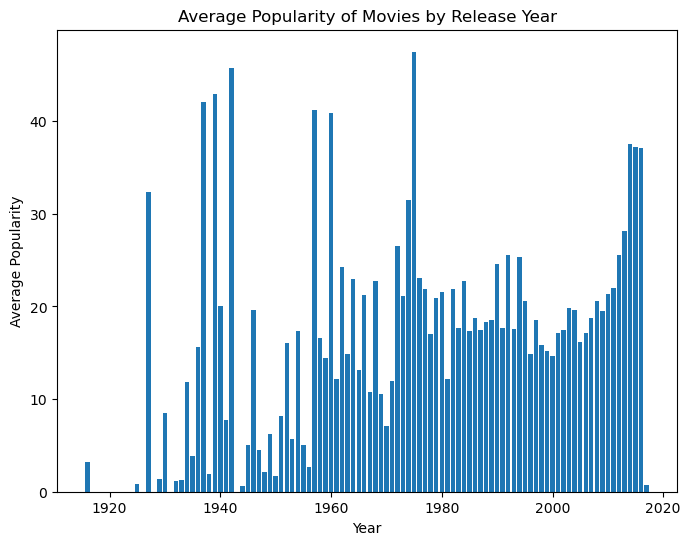

In [37]:
#Visual 1, histograme of release Year with Popularity 

# Drop rows where 'release_date' could not be converted to datetime
cleaned_df = cleaned_df.dropna(subset=['release_date'])

cleaned_df.loc[:, 'year'] = cleaned_df['release_date'].dt.year

# Group by year and calculate the average popularity
popularity_by_year = cleaned_df.groupby('year')['popularity'].mean()

# Plot the histogram
plt.figure(figsize=(8, 6))
plt.bar(popularity_by_year.index, popularity_by_year.values)
plt.xlabel('Year')
plt.ylabel('Average Popularity')
plt.title('Average Popularity of Movies by Release Year')
plt.show()

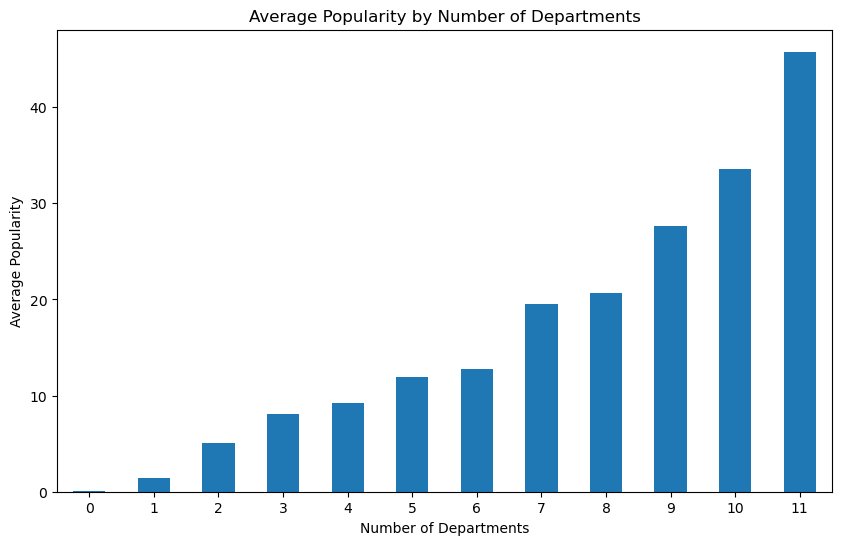

In [34]:
#Visual 2, barplot of release Year with number of departments 

popularity_by_departments = cleaned_df.groupby('num_departments')['popularity'].mean()

# Plot the bar plot
plt.figure(figsize=(10, 6))
popularity_by_departments.plot(kind='bar')
plt.xlabel('Number of Departments')
plt.ylabel('Average Popularity')
plt.title('Average Popularity by Number of Departments')
plt.xticks(rotation=360)
plt.show()

### Movies that have release dates from 2000 and above have an up-trend in movie popularity. Also, it is evident that the movie's popularity rises relative to the number of departments

*Identify the film team members who have received 100 rating and above in movie rating*

In [35]:


# Filter for movies with popularity of 100 and above
high_popularity_movies = cleaned_df.loc[cleaned_df['popularity'] >= 100].copy()



# Show the results
high_popularity_movies[['title', 'crew_names', 'popularity']]


,title,crew_names,popularity
0,Avatar,"[Stephen E. Rivkin, Rick Carter, Christopher B...",150.437577
1,Pirates of the Caribbean: At World's End,"[Dariusz Wolski, Gore Verbinski, Jerry Bruckhe...",139.082615
2,Spectre,"[Thomas Newman, Sam Mendes, Anna Pinnock, John...",107.376788
3,The Dark Knight Rises,"[Hans Zimmer, Charles Roven, Christopher Nolan...",112.312950
5,Spider-Man 3,"[Francine Maisler, Joseph M. Caracciolo Jr., S...",115.699814
...,...,...,...
3232,Pulp Fiction,"[Quentin Tarantino, Quentin Tarantino, Lawrenc...",121.463076
3337,The Godfather,"[Francis Ford Coppola, Francis Ford Coppola, G...",143.659698
3719,One Flew Over the Cuckoo's Nest,"[Jane Feinberg, Mike Fenton, Arthur Coburn, Sa...",127.525581
3865,Whiplash,"[Terri Taylor, Richard Henderson, Jeffrey Stot...",192.528841


### The  above table displays name of crew members that earned a rating of 100 and more in movie rating.

### **5.2:** Reflection



#### ْْْRmove movies without a website to ensure all entries have accessible and verifiable information.
    
#### Create a dictionary containing the cast IDs from the "cast" column, making it easier to display complete cast information.
    
#### Remove any films that have an empty list of "keywords" as it make a qulity issue.

In [36]:
cleaned_df

,movie_id,title,budget,revenue,release_date,popularity,vote_count,vote_average,crew_names,num_departments,year
0,19995,Avatar,237000000.0,"2,787,965,087.00",2009-12-10,150.437577,11800,7.2,"[Stephen E. Rivkin, Rick Carter, Christopher B...",11,2009.0
1,285,Pirates of the Caribbean: At World's End,300000000.0,"961,000,000.00",2007-05-19,139.082615,4500,6.9,"[Dariusz Wolski, Gore Verbinski, Jerry Bruckhe...",9,2007.0
2,206647,Spectre,245000000.0,"880,674,609.00",2015-10-26,107.376788,4466,6.3,"[Thomas Newman, Sam Mendes, Anna Pinnock, John...",11,2015.0
3,49026,The Dark Knight Rises,250000000.0,"1,084,939,099.00",2012-07-16,112.312950,9106,7.6,"[Hans Zimmer, Charles Roven, Christopher Nolan...",11,2012.0
4,49529,John Carter,260000000.0,"284,139,100.00",2012-03-07,43.926995,2124,6.1,"[Andrew Stanton, Andrew Stanton, John Lasseter...",11,2012.0
...,...,...,...,...,...,...,...,...,...,...,...
4798,9367,El Mariachi,220000.0,"2,040,920.00",1992-09-04,14.269792,238,6.6,"[Robert Rodriguez, Robert Rodriguez, Robert Ro...",6,1992.0
4799,72766,Newlyweds,9000.0,"117,031,352.92",2011-12-26,0.642552,5,5.9,"[Edward Burns, Edward Burns, Edward Burns, Wil...",6,2011.0
4800,231617,"Signed, Sealed, Delivered",37042837.0,"117,031,352.92",2013-10-13,1.444476,6,7.0,"[Carla Hetland, Harvey Kahn, Adam Sliwinski, M...",8,2013.0
4801,126186,Shanghai Calling,37042837.0,"117,031,352.92",2012-05-03,0.857008,7,5.7,"[Daniel Hsia, Daniel Hsia]",2,2012.0
